<a href="https://colab.research.google.com/github/MohitSoni11/Complete-ML-DS-Bootcamp/blob/main/7-Deep-and-Transfer-Learning/dog_species_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End to-End Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using Tensorflow and Tensorflow Hub.

## Problem

When I'm sitting at the cafe and I take a photo of a dog, I should be able to find out the breed of that dog.

## Data

The data we're using is from Kaggle's Dog Breed Identification competition - https://www.kaggle.com/competitions/dog-breed-identification/data.

* `train.zip` - the training set, you are provided the breed for these dogs
* `test.zip` - the test set, you must predict the probability of each breed for each image
* `sample_submission.csv` - a sample submission file in the correct format
* `labels.csv` - the breeds for the images in the train set

## Evaluation

The evaluation is a file with prediction probabilities for each dog bread for each test image.

Submissions are evaluated on Multi Class Log Loss between the predicted probability and the observed target.

## Features

Some information about the data:
* We're deadling with images (unstructured data) so it's probably best we use deep learning/transfer learning
* There are 120 breeds of dogs (this means there are 120 different classes)
* There are around 10,000+ images in the training set (these images have labels)
* THere are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them)

In [ ]:
# Unzipping the data folder from Kaggle into Google Drive
# !unzip '/content/drive/MyDrive/Dog Vision/dog-breed-identification.zip' -d '/content/drive/MyDrive/Dog Vision/'

## Get Our Workspace Ready

* Import Tensorflow
* Import Tensorflow Hub
* Make sure we're using a GPU

In [ ]:
# Import Tensorflow into Colab
import tensorflow as tf
print('TF version:', tf.__version__)

TF version: 2.9.2


In [ ]:
# Import Tensorflow Hub
import tensorflow_hub as hub
print('TF Hub version:', hub.__version__)

TF Hub version: 0.12.0


In [ ]:
# Check for GPU availability
print('GPU', 'available' if tf.config.list_physical_devices('GPU') else 'not available')

GPU available


## Getting Our Data Ready

With all machine learning models, our data has to be in numerical format. So, in addition to some data manipulation in the beginning, our goal is to use tensorflow to turn our images into Tensors (numerical representations).

In [ ]:
# Checking out the labels of our data
import pandas as pd
labels_csv = pd.read_csv('/content/drive/MyDrive/Dog Vision/labels.csv')
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


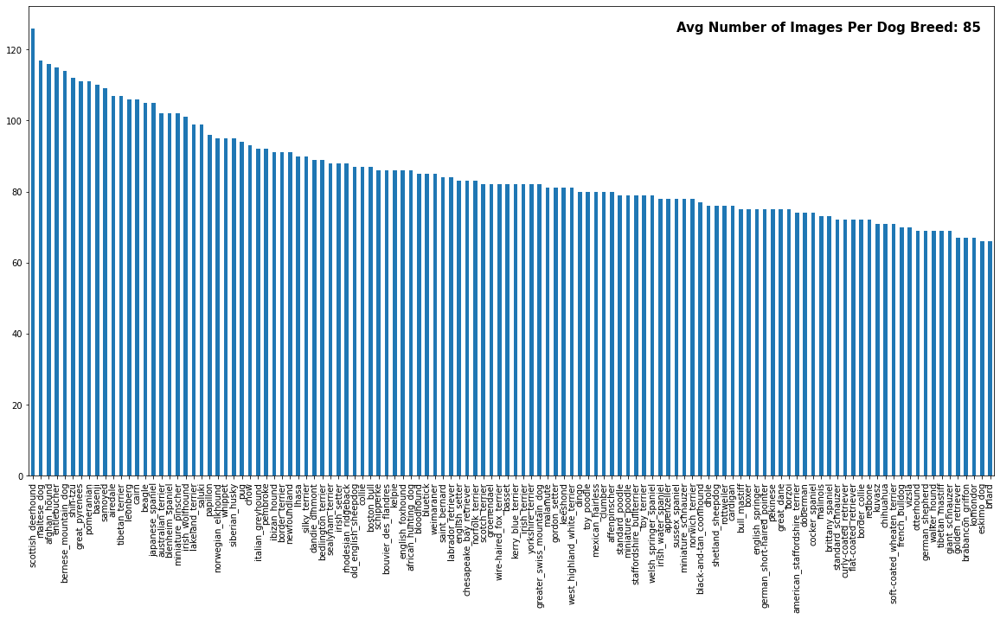

In [ ]:
# How many images are there of each dog breed?
import matplotlib.pyplot as plt
labels_csv['breed'].value_counts().plot.bar(figsize=(20, 10))

# Displaying average number of images of each dog breed 
# (Google recommends you should have at least 10 images per class)
avg_img = labels_csv['breed'].value_counts().mean()
plt.text(80, 125, f'Avg Number of Images Per Dog Breed: {avg_img:.0f}', {'weight': 'bold', 'size': 15});

### Accessing Images and their Labels

We'll be using paths from the Google Drive to access our train images, and we'll use our `labels_csv dataframe to access labels -- ending with transforming our categorical labels into numerical format.

In [ ]:
# Create pathnames from image ID's
imagepaths = '/content/drive/MyDrive/Dog Vision/train/' + labels_csv['id'] + '.jpg'
imagepaths[0], imagepaths[1], imagepaths[2]

('/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg')

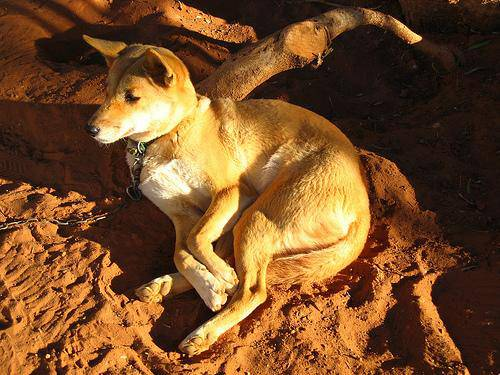

In [ ]:
# Let's view an image in our training dataset
from IPython.display import Image
Image(imagepaths[1])

Now that we've got our training image paths in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = np.array(labels_csv['breed'])
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# Making sure that the number of images we have is the same as the number of corresponding labels we have
if (len(labels) == len(imagepaths)):
  print('We have the same number of images and corresponding labels. Proceed.')
else:
  print('Warning! The number of images do not match the number of labels!')

We have the same number of images and corresponding labels. Proceed.


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds) # should be 120

120

In [ ]:
# Turn every label into an array of booleans and then into an array of integers
boolean_labels = []
for label in labels:
  arr = (label == unique_breeds).astype(int) # Turning boolean array into integer array
  boolean_labels.append(arr)

boolean_labels[:2]

[array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
 array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0])]

### Creating Training & Validation Sets

Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [ ]:
# Checking that the length of boolean_labels is equal to imagepaths
len(imagepaths), len(boolean_labels)

(10222, 10222)

In [ ]:
# Setup X & y variables
X = imagepaths
y = boolean_labels

We're going to start of experimenting with ~1000 images and increase as needed because we don't want the training time to be too high.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:'slider', min:1000, max:10000, step:1000}

In [ ]:
# Split data into train/validation sets of total size NUM_IMAGES
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

### Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors, we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable `image`
3. Turn our `image` (a jpg) into Tensors (a way of structuring numbers like numpy arrays)
4. Normalize our `image` (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

In [ ]:
# Need to keep constant image size so data that the model is trained on and fed has the same structure
IMG_SIZE = 224 #@param {type:'slider', min:100, max:500, step:2}

In [ ]:
# Creating function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  '''
  Takes an image file path and turns the image into a Tensor.
  '''

  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn jpeg image into Tensor with 3 color channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert the color channel values from 0-255 to 0-1 (normalization)
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[img_size, img_size])

  return image

### Turning our Data into Batches

Batches are a small portion of data that are used to train our model. For example, a batch size of 32 images would mean that at one time, the model will be calculating on those 32 images, and in the next loop/training session, the model will use the next batch (the next 32 images).

Why turn our data into batches? Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

In order to use TensorFlow  effectively, we need our data in the form of Tensor tuples which look like this: `(image, label)`

NOTE: A batch size of 32 would mean that you provide the model 32 of these Tensor tuples in the first training session.

In [ ]:
# Create a simple function to return a Tensor tuple (image, label)
def get_image_label(image_path, label):
  '''
  Takes an image file path name and the associated label, processes the image, 
  and returns a tuple of (image, label).
  '''  

  image = process_image(image_path)
  return image, label

Now that we've gotten a way to turn our data into tuples of Tensors in the form `(image, label)`, let's make a function to turn all of our data (`X` & `y`) into batches.

In [ ]:
# Define the batch size, 32 is good start
BATCH_SIZE = 32 #@param {type:'slider', min:10, max:100, step:2}

In [ ]:
# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  '''
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input(no labels).
  '''

  # If the data is a test dataset, we know we don't have labels
  if (test_data):
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X))
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch

  # If the data is a validation dataset, we don't need to shuffle it
  elif (valid_data):
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch

  # Training dataset needs to be shuffled
  print('Creating training data batches...')
  data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
  data = data.shuffle(buffer_size=len(X))
  data_batch = data.map(get_image_label).batch(batch_size)
  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.int32, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.int32, name=None)))

### Visualizing Data Batches

Our data is now in batches. However, these can be a little hard to understand/comprehend, so let's visualize them!

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  '''
  Displays a plot of 25 images and their labels from a data batch.
  '''

  # Setup figure
  plt.figure(figsize=(10, 10))

  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis('off')

In [ ]:
# Taking first batch of images and labels
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

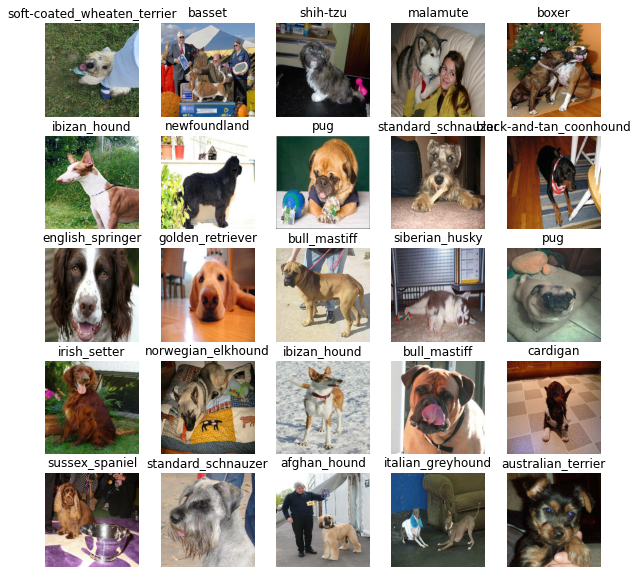

In [ ]:
# Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

## Building a Model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model
* The output shape (image labels, in the form of Tensors) of our model
* The URL of the model we want to use from Tensorflow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width,  color channels

In [ ]:
# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

In [ ]:
# Setup model URL from Tensorflow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4'

Now we've got our inputs, outputs, and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape, and the model we've chosen as parameters
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that)
* Compiles the model (says it should be evaluated and improved)
* Builds the model (tells the model the input shape it'll be getting)
* Returns the model

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print('Building model with: ', model_url)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(model_url), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=output_shape, activation='softmax') # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  # Build the model
  model.build(input_shape)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_4 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_4 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


If you look at the summary of the model above, you can see that 5 million of the parameters were non-trainable. This is because we are using transfer learning so we are already getting a trained model and then just training a few more parameters (120,000) to get our desired output.

## Creating Callbacks

Callbacks are helper functions a mode lcan use during training to save its progress, check its progress, or stop training early if a model stops improving.

We'll create 2 callbacks, one for TensorBoard which helps track our model's progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function
3. Visualize our model's training logs with the `%tensorboard` magic function (we'll  do this after model training)

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import datetime
import os

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join('/content/drive/MyDrive/Dog Vision/logs', 
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  
  return tf.keras.callbacks.TensorBoard(logdir)

### EarlyStopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metrics stops improving.

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3)

## Training our Model (on subset of data)

Our first model is only going to train on 1000 (NUM_IMAGES) images, to make sure everything is working.

In [ ]:
# Epochs = number of times training data is fed to model so parameters can be updated
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100, step:10}

In [ ]:
# Check to make sure we're still running on a GPU
if (tf.config.list_physical_devices('GPU')):
  print('GPU available!')
else:
  print('GPU unavailable :(')

GPU available!


Let's create a function which trains a model
* Create a model using `create_model()`
* Setup TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  '''
  Trains a given model and returns the trained version.
  '''

  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(train_data, 
            epochs=NUM_EPOCHS, 
            validation_data=val_data, 
            validation_freq=1, 
            callbacks=[tensorboard, early_stopping])

  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 346s 13s/step - loss: 4.5888 - accuracy: 0.1000 - val_loss: 3.4489 - val_accuracy: 0.2450
Epoch 2/100
25/25 [==============================] - 3s 132ms/step - loss: 1.6534 - accuracy: 0.6900 - val_loss: 2.1551 - val_accuracy: 0.4850
Epoch 3/100
25/25 [==============================] - 3s 131ms/step - loss: 0.5874 - accuracy: 0.9300 - val_loss: 1.6520 - val_accuracy: 0.5800
Epoch 4/100
25/25 [==============================] - 3s 131ms/step - loss: 0.2594 - accuracy: 0.9912 - val_loss: 1.4965 - val_accuracy: 0.6250
Epoch 5/100
25/25 [==============================] - 3s 132ms/step - loss: 0.1534 - accuracy: 0.9950 - val_loss: 1.4175 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 4s 160ms/step - loss: 0.1056 - accuracy: 0.9987 - val_loss: 1.3542 - val_accuracy: 0.6400
Epoch 7/100
25/25 [=============================

It looks as if our model is overfitting because it has a 100% accuracy on the training data but just a 68% accuracy on the validation set. Overfitting is a good sign because it shows that our model is learning! However, it clearly cannot generalize to new data...

### Checking the TensorBoard Logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and Evaluating Predictions Using Trained Model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 2s 161ms/step


array([[2.2778525e-03, 2.3335218e-05, 5.5851258e-05, ..., 1.2238842e-04,
        1.1495876e-05, 4.4527641e-03],
       [1.3498155e-03, 4.7372928e-04, 4.9665300e-03, ..., 1.2970815e-03,
        9.0814265e-04, 1.5643574e-04],
       [1.2187462e-04, 9.1216963e-05, 6.7329413e-04, ..., 1.9091353e-04,
        3.3820579e-05, 8.3289726e-04],
       ...,
       [1.7859874e-06, 1.1017141e-05, 3.2230462e-05, ..., 1.1714830e-05,
        6.2865060e-05, 1.2296226e-04],
       [5.5106627e-03, 4.8425456e-05, 1.8480477e-04, ..., 6.8871821e-05,
        2.4373592e-05, 5.5940864e-03],
       [6.7873765e-04, 9.7389438e-06, 5.8250892e-04, ..., 2.0645640e-03,
        4.9934298e-04, 5.7763689e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  '''
  Turns an array of prediction probabilities into a label
  '''

  return unique_breeds[np.argmax(prediction_probabilities)]

In [ ]:
# Example: get a predicted label (breed of dog) for the first image in our validation set
get_pred_label(predictions[0])

'cairn'

Now since our validation data is still in a batch dataset, we'll have to unbatch it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  '''
  Takes a batched dataset of (image, label) Tensors and returns separate
  arrays of images and labels.
  '''

  images = []
  labels = []

  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  
  return images, labels

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make a function to make these a bit more visual!

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels, an array of images, and an integer
* Convert the prediction probabilities to a predicted label
* Plot the predicted label, its predicted probability, the truth label, and the target image on a single plot

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  '''
  View the prediction, ground truth, and image for sample n
  '''

  pred_prob = prediction_probabilities[n]
  true_label = labels[n]
  image = images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if prediction is right or wrong
  if (pred_label == true_label):
    color = 'green'
  else:
    color = 'red'

  # Change plot title
  plt.title('{} {:2.0f}% {}'.format(pred_label, 
                                    np.max(pred_prob) * 100,
                                    true_label),
                                    color=color)


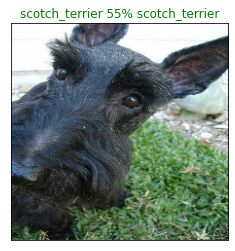

In [ ]:
val_images, val_labels = unbatchify(val_data)
plot_pred(predictions, val_labels, val_images)

Now we've got one function to visualize our model's top predictions, let's make another to view our model's top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  '''
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  '''

  pred_prob = prediction_probabilities[n]
  true_label = labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color='grey')
  
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')
  
  # Change color of true label
  if (np.isin(true_label, top_10_pred_labels)):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass

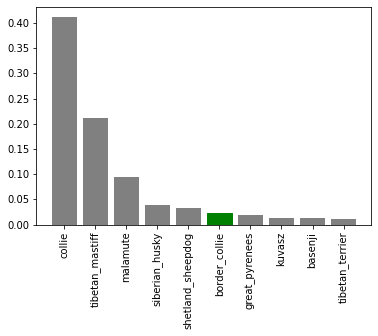

In [ ]:
plot_pred_conf(predictions, val_labels, n=9)

Now we've got some functions to help us visualize our predictions and evaluate our model. Let's check out a few.

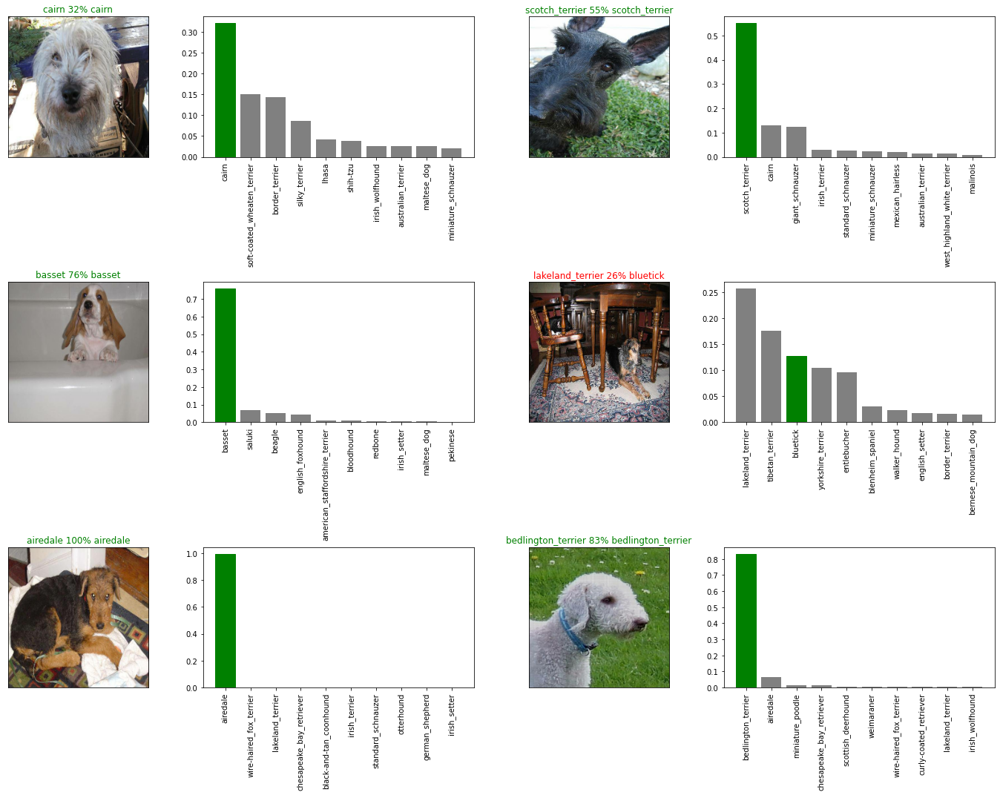

In [ ]:
# Let's checkout a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2

num_images = num_rows * num_cols
plt.figure(figsize=(10 * num_cols, 5 * num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
  plot_pred(predictions, val_labels, val_images, n=i + i_multiplier)
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
  plot_pred_conf(predictions, val_labels, n=i + i_multiplier)
  plt.tight_layout(h_pad=1.0)

plt.show()

## Saving and Reloading our Trained Model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  '''
  Saves a given model in a model's directory and appends a suffix (string)
  '''

  # Create a model directory pathname with current time
  modeldir = os.path.join('/content/drive/MyDrive/Dog Vision/models',
                          datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))
  
  model_path = modeldir + '-' + suffix + '.h5' # save format of model
  print(f'Saving model to: {model_path}...')
  model.save(model_path)

  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  '''
  Loads a saved model from a specified path.
  '''

  print(f'Loading saved model from: {model_path}')
  model = tf.keras.models.load_model(model_path, 
                                     custom_objects={'KerasLayer': hub.KerasLayer})
  
  return model

In [ ]:
# Saving our model that is trained on 1000 images
save_model(model, suffix='1000-images-mobilenetv2-Adam')

Saving model to: /content/drive/MyDrive/Dog Vision/models/20221231-10061672481200-1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Dog Vision/models/20221231-10061672481200-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Loading our trained model
loaded_1000_image_model = load_model('/content/drive/MyDrive/Dog Vision/models/20221231-10061672481200-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20221231-10061672481200-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the re-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 115ms/step - loss: 1.2366 - accuracy: 0.6750


[1.236627221107483, 0.675000011920929]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 94ms/step - loss: 1.2366 - accuracy: 0.6750


[1.236627221107483, 0.675000011920929]

## Training a Big Model (on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.int32, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience=3)

**NOTE:** Running the cell below will take a little while... (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

Didn't run the below cell because the course wanted to submit our predictions from this trained model to Kaggle. I wasn't interested in submitting to an already completed competition so I didn't train the model.

In [ ]:
# Fit the full model to the full data
'''
full_model.fit(full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])
'''